In [1]:
import os
import json
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from parsing import Parser
from PIL import Image, ImageDraw, ImageFont
from io import BytesIO
import base64
from plotly.subplots import make_subplots
from tqdm import tqdm

In [2]:
BASE_DIR = "E:/Processed/Results/0344-6782/"
files = []
for dir_path, dir_names, file_names in os.walk(BASE_DIR):
    for f in file_names :
                if f.endswith(".json"):
                    files.append(os.path.join(dir_path, f))
print("Found {} files".format(len(files)))


Found 11760 files


In [3]:
flowers = []
pollinators = []
num_flowers = []
for i in tqdm(range(len(files))):
    parser = Parser(files[i])
    flowers.append(parser.get_flower_df())
    pollinators.append(parser.get_pollinator_df())
    num_flowers.append(len(parser.flowers))
flower_df = pd.concat(flowers)
pollinator_df = pd.concat(pollinators)
print("Number of images:", len(files))
print("Number of flowers:",len(flower_df))
print("Number of pollinators:",len(pollinator_df))
print("Avg Flowers", np.mean(num_flowers))
print("min Flowers", np.min(num_flowers))
print("max Flowers", np.max(num_flowers))

100%|██████████| 11760/11760 [01:38<00:00, 119.58it/s]


Number of images: 11760
Number of flowers: 72947
Number of pollinators: 1643
Avg Flowers 6.202976190476191
min Flowers 0
max Flowers 12


In [8]:
pollinator_df["hour"] = pollinator_df["timestamp"].dt.hour
pollinator_df["day"] = pollinator_df["timestamp"].dt.day
pollinator_df["minute"] = pollinator_df["timestamp"].dt.minute
pollinator_df["time"] = pollinator_df["hour"] + pollinator_df["minute"]/60
flower_df["hour"] = flower_df["timestamp"].dt.hour
flower_df["day"] = flower_df["timestamp"].dt.day
unique_polli_classes = list(set(pollinator_df["class_name"]))
unique_flower_classes = list(set(flower_df["class_name"]))
node_ids = list(set(flower_df["node_id"]))
unique_flower_classes = list(set(flower_df["class_name"]))
unique_pollinator_classes = list(set(pollinator_df["class_name"]))


In [14]:
vals_flower = []
for flower_class in unique_flower_classes:
    df_flower_class = flower_df[flower_df["class_name"] == flower_class]
    vals_flower.append(len(df_flower_class))
vals_pollinator = []
for pollinator_class in unique_pollinator_classes:
    df_pollinator_class = pollinator_df[pollinator_df["class_name"] == pollinator_class]
    vals_pollinator.append(len(df_pollinator_class))
fig = make_subplots(
    rows=1,
    cols=2,
    subplot_titles=["Flowers", "Pollinators"],
    specs=[[{"type": "pie"}, {"type": "pie"}]],
)
fig.add_trace(
    go.Pie(
        labels=unique_flower_classes,
        values=vals_flower,
        textinfo="label+percent",
        showlegend=False,
    ),
    row=1,
    col=1,
)
fig.add_trace(
    go.Pie(
        labels=unique_pollinator_classes,
        values=vals_pollinator,
        textinfo="label+percent",
        showlegend=False,
    ),
    row=1,
    col=2,
)


fig.show()


In [36]:
fig = make_subplots(rows=len(unique_pollinator_classes), cols=1, shared_xaxes=True)
for c in unique_pollinator_classes:
    dfp = pollinator_df[pollinator_df["class_name"] == c]
    times = pd.to_datetime(dfp["timestamp"])
    class_series = dfp.groupby(times.dt.hour).class_name.count()
    fig.add_trace(go.Scatter(
        x=class_series.index,
        y=class_series.values,
        name=c,
        fill = "tozeroy",
    ), row=unique_pollinator_classes.index(c) + 1, col=1)
fig.update_layout(
    title_text="Pollinator Counts by Hour of Day",
    template="plotly_white",
    height=800,
    
)

fig.show()

In [28]:
import plotly.figure_factory as ff
#unique_classes = ["wildbiene","honigbiene","fliege","schwebfliege","hummel"]
times_p = []
for c in unique_pollinator_classes:
    dfp = pollinator_df[pollinator_df["class_name"] == c]
    times_p.append(dfp["time"])


fig = ff.create_distplot(times_p, unique_pollinator_classes,show_hist=False,curve_type='kde',histnorm = 'probability')

fig.update_layout(
    template="plotly_white",
    #width = 2100,
    #height = 500,
    #font_size=20,
    #paper_bgcolor='rgba(0,0,0,0)',
    #plot_bgcolor='rgba(0,0,0,0)',
    legend_orientation="h",

)
fig.show()

In [31]:
colors = [
    "#1f77b4",
    "#ff7f0e",
    "#2ca02c",
    "#d62728",
    "#9467bd",
    "#8c564b",
    "#e377c2",
    "#7f7f7f",
    "#bcbd22",
    "#17becf",
]
c = "wildbiene"
print(colors[unique_pollinator_classes.index(c)])

for c in unique_pollinator_classes:
    dfp = pollinator_df[pollinator_df["class_name"] == c]
    group_labels = [c]

    fig = ff.create_distplot(
        [dfp["time"]],
        group_labels,
        bin_size=0.2,
        show_hist=False,
        curve_type="kde",
        histnorm="probability",
        
        colors=[colors[unique_pollinator_classes.index(c)]],
    )
    fig.update_layout(
        template="plotly_white",
        title_text=c,
    )
    fig.show()


#9467bd


In [32]:
def resize_image(img, size):
    w, h = img.size
    if w > h:
        h = int(h * size / w)
        w = size
    else:
        w = int(w * size / h)
        h = size
    img = img.resize((w, h), Image.Resampling.LANCZOS)
    return img

def image_grid(df, rows, cols, offset=0):
    sz = 320
    
    
    fnt = ImageFont.truetype("arial.ttf", 18)
    images = []
    scores = []
    for i in range(rows*cols):
        try:
            col = df.iloc[i+offset]
            im = Image.open(BytesIO(base64.b64decode(col.crop)))
            im = resize_image(im, sz-1)
            images.append(im)
            scores.append(str(col.score))
        except:
            images.append(Image.new("RGB", (sz, sz), "white"))
            scores.append("")

    grid = Image.new('RGB', (sz*cols, sz*rows), (255, 255, 255))
    for i in range(rows):
        for j in range(cols):
            grid.paste(images[i*cols+j], (j*sz, i*sz))
    d = ImageDraw.Draw(grid)
    for i in range(rows):
        for j in range(cols):
            d.text((j*sz, i*sz), str(scores[i*cols+j]), fill=(255, 0, 0), font=fnt)
    return grid

fliege


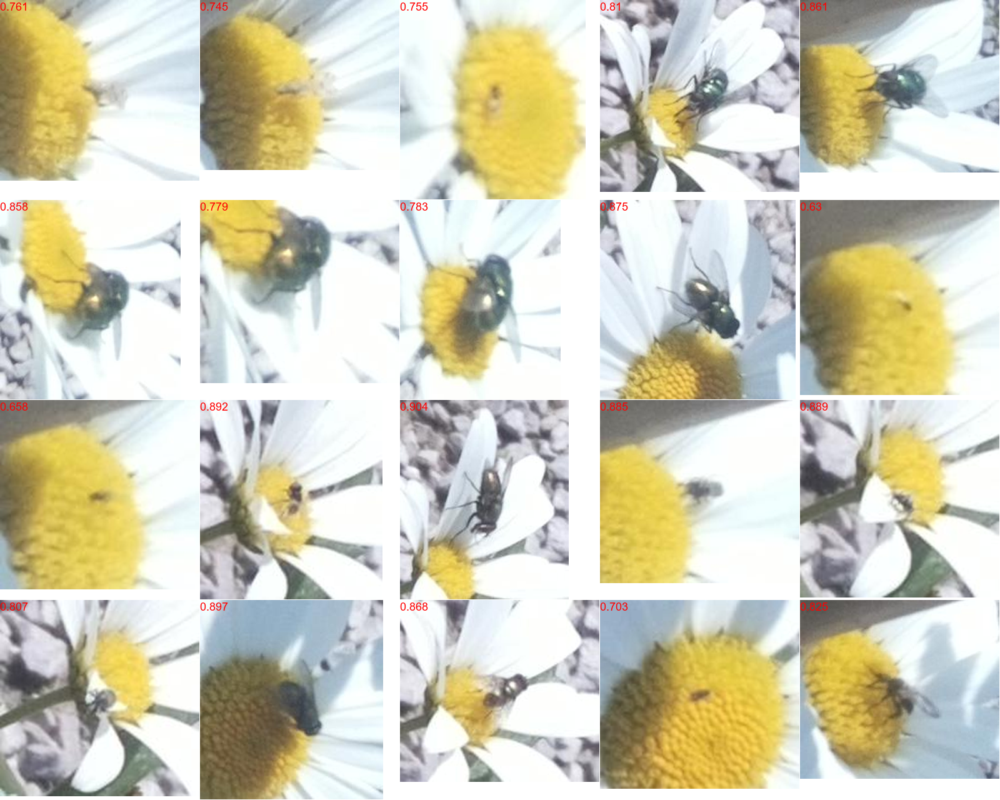

schwebfliege


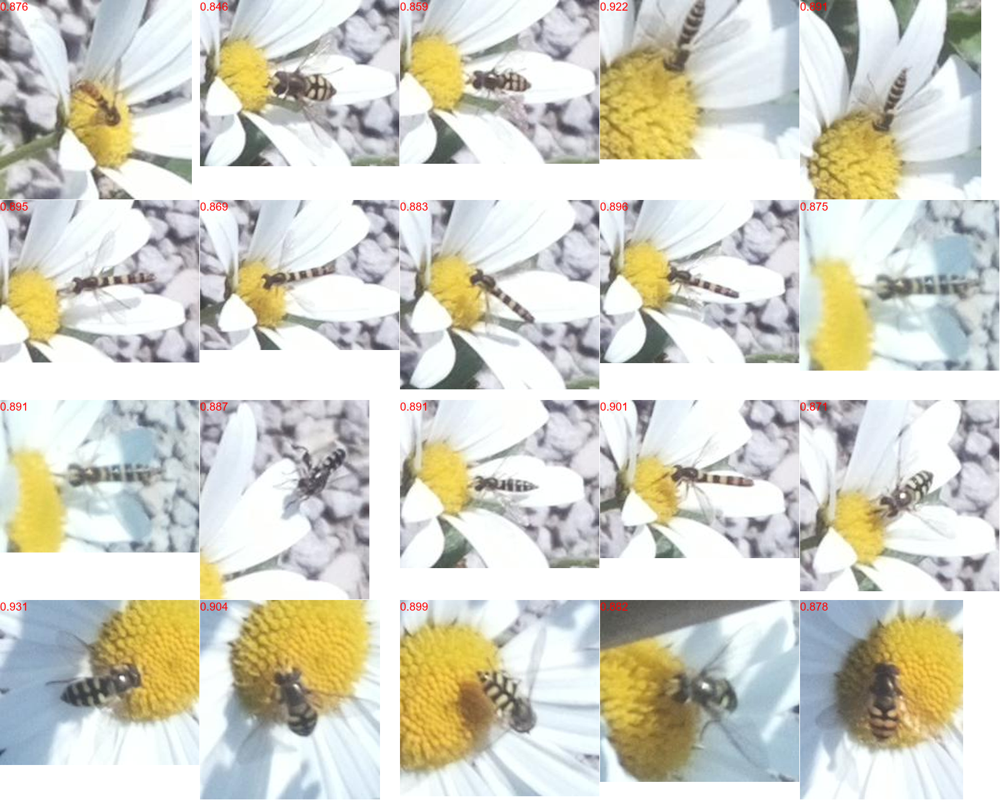

honigbiene


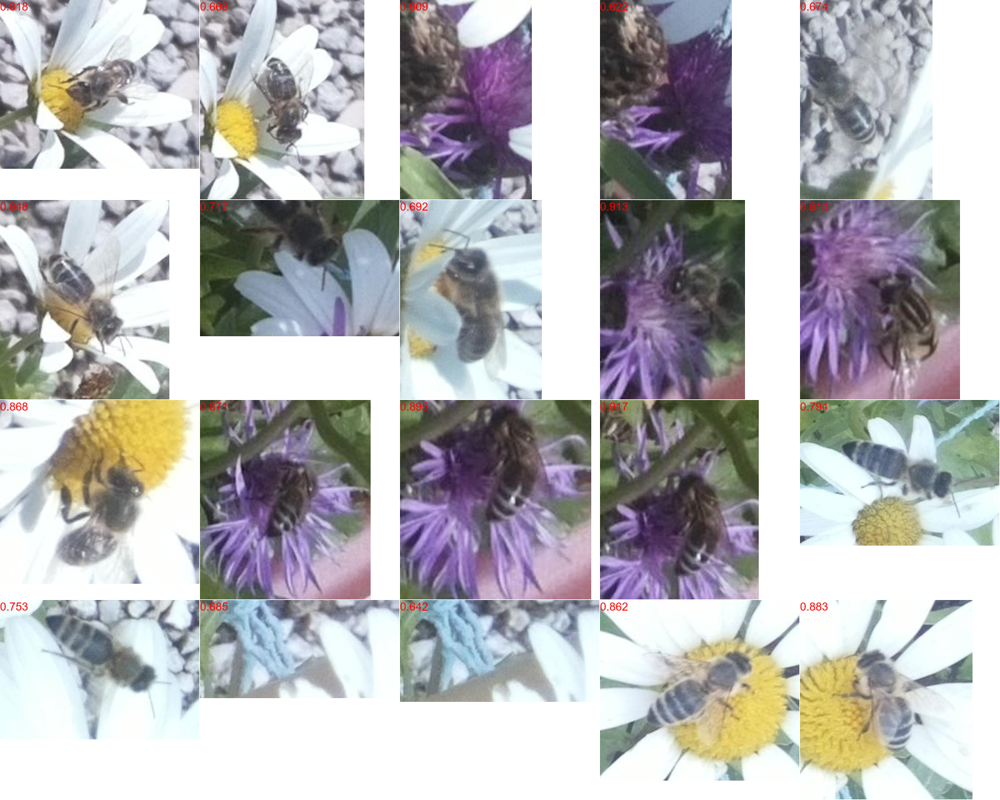

hummel


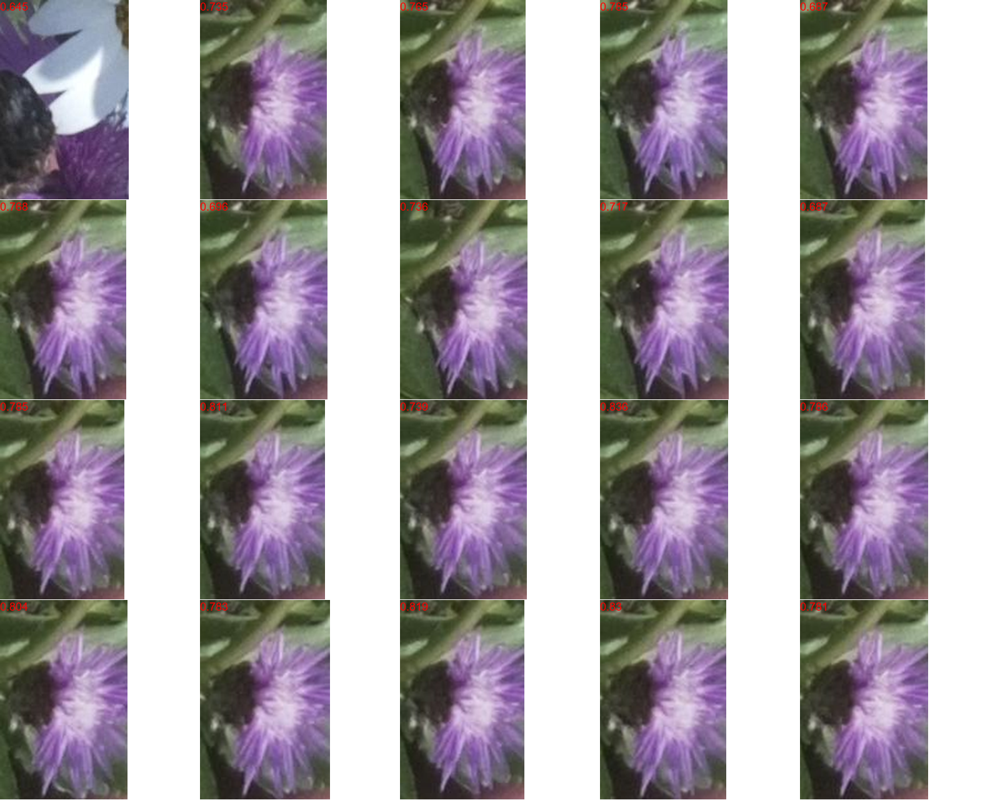

wildbiene


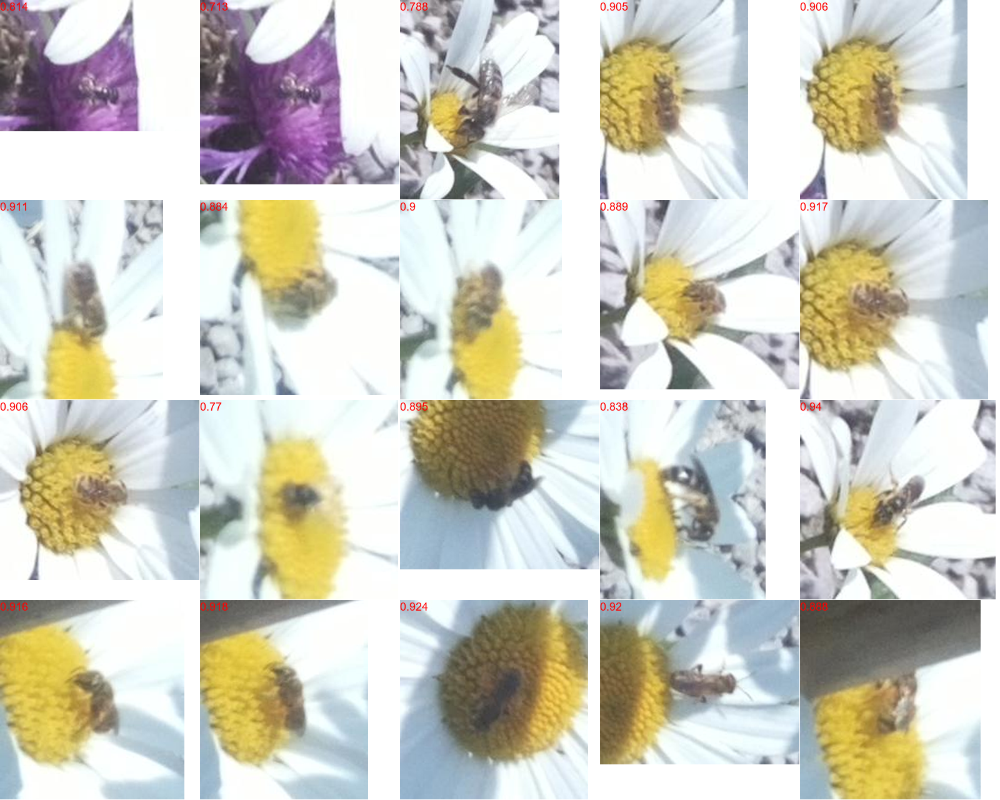

In [35]:
for c in unique_polli_classes:
    dfp = pollinator_df[pollinator_df["class_name"] == c]
    cols = 5
    rows = min(int(len(dfp) / cols) + 1, 4)
    grid = image_grid(dfp, rows, cols, offset=0)
    #grid.save("pollinator_"+c+".png")
    print(c)
    display(grid)
    